In [2]:
import numpy as np
import matplotlib.pyplot as plt


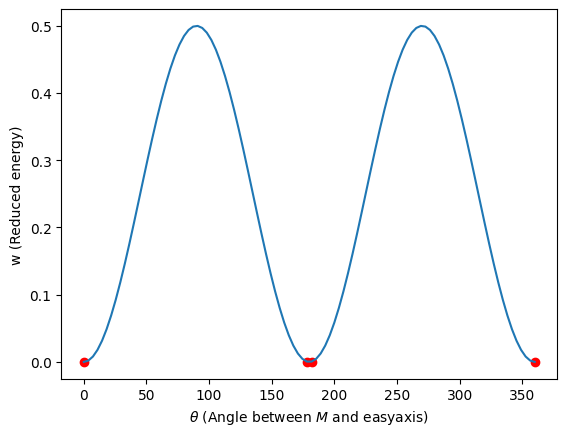

In [125]:
theta = np.linspace(0, 2*np.pi, 100)
theta_min = []

w = 0.5 * (np.sin(theta))**2

plt.plot(np.rad2deg(theta), w)

min_value = min(w)
tolerance = 0.0007  # Define a tolerance level for comparison

for i, value in enumerate(w):
    if abs(value - min_value) < tolerance:
        theta_min.append(np.rad2deg(theta[i]))

plt.scatter(theta_min, [min_value] * len(theta_min), color='r')

plt.xlabel(r'$\theta$ (Angle between $M$ and easy axis)')
plt.ylabel(r'w (Reduced energy)')
plt.show()

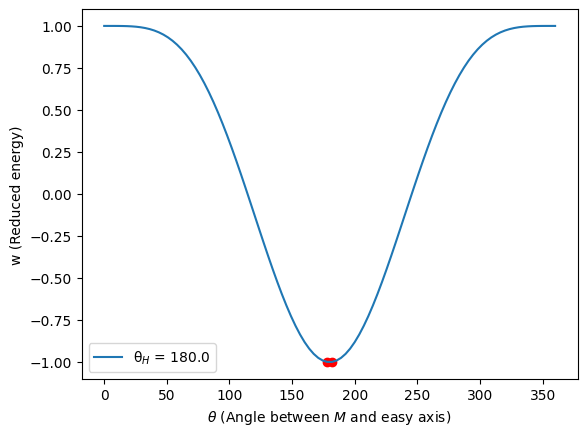

In [126]:
theta = np.linspace(0,2*np.pi,100)
theta_h = np.pi
h = 1
theta_min = []
w = []

phi = np.zeros(len(theta))

for i in range(len(theta)):
    phi[i] = theta[i] - theta_h

w = 0.5 * (np.sin(theta))**2 - h * np.cos(phi)

plt.plot(np.rad2deg(theta),w, label=f'\u03B8$_H$ = {np.rad2deg(theta_h)}')

min_value = min(w)

tolerance = 0.0007  # Define a tolerance level for comparison

for i, value in enumerate(w):
    if abs(value - min_value) < tolerance:
        theta_min.append(np.rad2deg(theta[i]))

plt.scatter(theta_min, [min_value] * len(theta_min), color='r')
plt.xlabel(r'$\theta$ (Angle between $M$ and easy axis)')
plt.ylabel(r'w (Reduced energy)')
plt.legend()
plt.show()


In [145]:
print(np.rad2deg(np.arcsin(-1)))
print(np.cos(np.deg2rad(-90-90)))

-90.0
-1.0


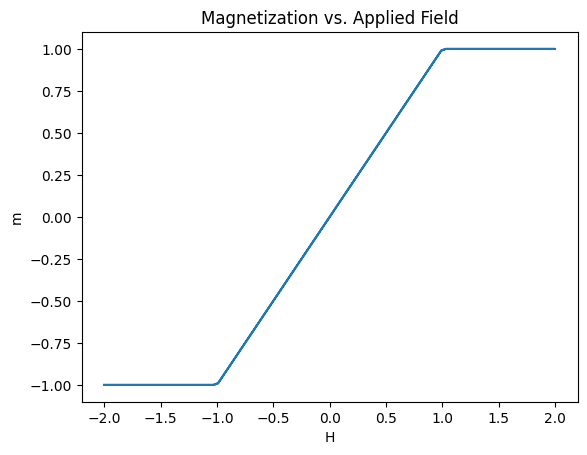

In [20]:
H1 = np.linspace(-2, 2, 100)
H2 = np.linspace(2, -2, 100)
H = np.concatenate((H1, H2))
phi = np.pi/2
m = []

for h in H:
    if h <= -1:
        theta = -np.pi/2
    elif h >= 1:
        theta = np.pi/2
    else:
        theta = np.arcsin(h)
    m.append(np.cos(theta - phi))

plt.plot(H, m)
plt.xlabel('H')
plt.ylabel('m')
plt.title('Magnetization vs. Applied Field')
plt.show()

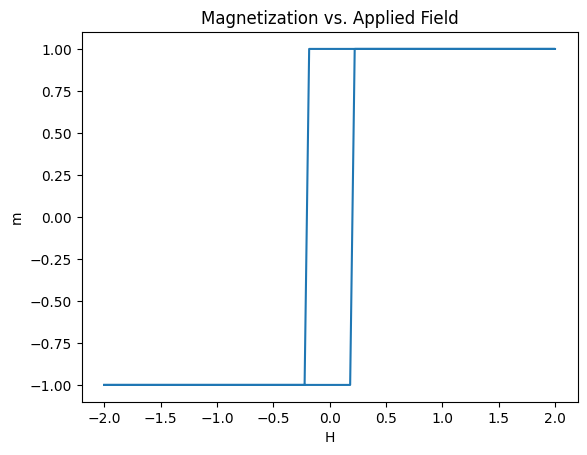

In [22]:
H1 = np.linspace(-2, 2, 100)
H2 = np.linspace(2, -2, 100)
H_arr = np.concatenate((H1, H2))
phi = 0
Ms = 1e7
Ku = 1e6
h_arr = []
m = []

for H in H_arr:
    h_arr.append((H*Ms)/(2*Ku))

for h in h_arr:
    if h <= -1:
        theta = np.pi
    elif h >= 1:
        theta = 0
    '''else:
        theta = np.arccos(-h)'''
    m.append(np.cos(theta - phi))

plt.plot(H_arr, m)
plt.xlabel('H')
plt.ylabel('m')
plt.title('Magnetization vs. Applied Field')
plt.show()

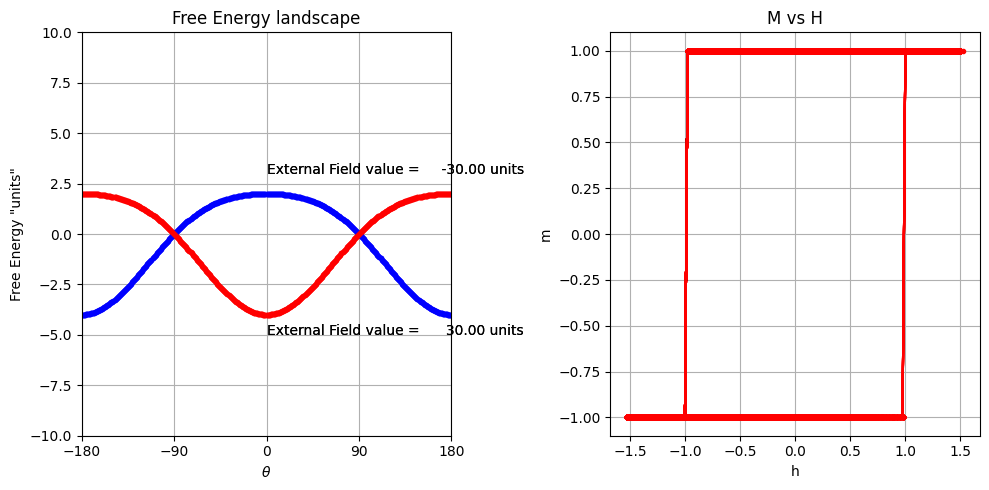

In [154]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from matplotlib.animation import FuncAnimation

# Material properties
Keff = 1e7  # Effective Uniaxial anisotropy J/m^3
Ms = 1e6    # Saturation Magnetization A/m
Hk = 2 * Keff / Ms  # Anisotropy field calculated

# Applied parameters
H1 = np.arange(-30, 31, 0.5)  # Applied External Field
Ha = np.concatenate((-H1, H1))  # Applied External Field
h = Ha / Hk
phi = 0.01 #In degrees angle b/n Easy axis and Field

# Initialize
magnet = np.zeros_like(h) #same shape and datatype as h
AngleStep = 1
theta = np.arange(-180, 181, AngleStep)  # In degrees b/n Easy axis and Magnetisation
theta0 =  0 # Equilibrium angle of magnetization with the EasyAxis
g = np.zeros_like(theta)

plt.figure(figsize=(10,5))
# Calculation of Energy land scape and hysteresis
for i in range(len(h)):
    g = -(np.cos(np.pi * theta / 180)) ** 2 - 2 * h[i] * np.cos(np.pi * phi / 180 - np.pi * theta / 180) #energy
    

    if i == 1: #not necessary we fixed the initial condition to be theta = 0; initial state , determine the global minima when saturated
        MinIdx, Minima = find_peaks(-g)
        theta0 = theta[MinIdx[0]]

    if i != 1:
        d1g = (2 * np.sin(np.pi * theta0 / 180) * np.cos(np.pi * theta0 / 180) +
               2 * h[i] * np.sin(np.pi * theta0 / 180 - np.pi * phi / 180))

        if d1g > 0:
            while d1g > 0:
                theta0 -= AngleStep
                d1g = (2 * np.sin(np.pi * theta0 / 180) * np.cos(np.pi * theta0 / 180) +
                       2 * h[i] * np.sin(np.pi * theta0 / 180 - np.pi * phi / 180))
            theta0 += AngleStep

        if d1g < 0:
            while d1g < 0:
                theta0 += AngleStep
                d1g = (2 * np.sin(np.pi * theta0 / 180) * np.cos(np.pi * theta0 / 180) +
                       2 * h[i] * np.sin(np.pi * theta0 / 180 - np.pi * phi / 180))
            theta0 -= AngleStep

    magnet[i] = theta0  # Equilibrium position of magnetization at value 'h, phi'

    if h[i] == h[0]:
        # Plotting details
        plt.subplot(1, 2, 1)
        plt.plot(theta, g, '-r.')
        plt.axis([-180, 180, -40, 40])
        plt.xticks(np.arange(-180, 181, 90))
        plt.ylim([-10,10])
        plt.title('Free Energy landscape')
        plt.xlabel(r'$\theta$')
        plt.ylabel('Free Energy "units"')
        str1 = f"External Field value = {Ha[i]:10.2f} units"
        plt.text(0, -5.0, str1)
        plt.grid(True)
    elif h[i] == h[120]:
    # Plotting details
        plt.subplot(1, 2, 1)
        plt.plot(theta, g, '-b.')
        plt.axis([-180, 180, -40, 40])
        plt.xticks(np.arange(-180, 181, 90))
        plt.ylim([-10,10])
        plt.title('Free Energy landscape')
        plt.xlabel(r'$\theta$')
        plt.ylabel('Free Energy')
        str1 = f"External Field value = {Ha[i]:10.2f} units"
        plt.text(0, 3.0, str1)
        plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(h[:i+1], np.cos(np.pi * phi / 180 - np.pi * magnet[:i+1] / 180),marker='.', color='red')
    plt.ylim([-1.1, 1.1])
    #plt.xlim([min(h), max(h)])
    plt.title('M vs H')
    plt.xlabel('h')
    plt.ylabel('m')
    plt.grid('True')
    
    plt.tight_layout()
plt.show()


In [156]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Material properties
Keff = 1e7  # Effective Uniaxial anisotropy J/m^3
Ms = 1e6    # Saturation Magnetization A/m
Hk = 2 * Keff / Ms  # Anisotropy field calculated

# Applied parameters
H1 = np.arange(-30, 31, 0.5)  # Applied External Field
Ha = np.concatenate((-H1, H1))  # Applied External Field
h = Ha / Hk
phi = 0.01  # In degrees angle b/n Easy axis and Field

# Initialize
AngleStep = 1
theta = np.arange(-180, 181, AngleStep)  # In degrees b/n Easy axis and Magnetisation
theta0 = 0  # Equilibrium angle of magnetization with the EasyAxis

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Preparing empty plots for the animation
line1, = axs[0].plot([], [], '-r.')
line2, = axs[1].plot([], [], marker='.')
axs[0].set_xlim(-180, 180)
axs[0].set_ylim(-10, 10)
axs[0].set_xlabel(r'$\theta$')
axs[0].set_ylabel('Free Energy')
axs[0].set_title('Free Energy landscape')
axs[0].grid(True)

axs[1].set_xlim(min(h), max(h))
axs[1].set_ylim(-1.1, 1.1)
axs[1].set_xlabel('h')
axs[1].set_ylabel('m')
axs[1].set_title('M vs H')
axs[1].grid(True)
plt.tight_layout()

magnet = np.zeros_like(h)  # same shape and datatype as h
g = np.zeros_like(theta)

def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return line1, line2

def update(i):
    global theta0
    g = -(np.cos(np.pi * theta / 180)) ** 2 - 2 * h[i] * np.cos(np.pi * phi / 180 - np.pi * theta / 180)

    if i == 1:
        MinIdx, Minima = find_peaks(-g)
        theta0 = theta[MinIdx[0]]

    if i != 1:
        d1g = (2 * np.sin(np.pi * theta0 / 180) * np.cos(np.pi * theta0 / 180) +
               2 * h[i] * np.sin(np.pi * theta0 / 180 - np.pi * phi / 180))

        if d1g > 0:
            while d1g > 0:
                theta0 -= AngleStep
                d1g = (2 * np.sin(np.pi * theta0 / 180) * np.cos(np.pi * theta0 / 180) +
                       2 * h[i] * np.sin(np.pi * theta0 / 180 - np.pi * phi / 180))
            theta0 += AngleStep

        if d1g < 0:
            while d1g < 0:
                theta0 += AngleStep
                d1g = (2 * np.sin(np.pi * theta0 / 180) * np.cos(np.pi * theta0 / 180) +
                       2 * h[i] * np.sin(np.pi * theta0 / 180 - np.pi * phi / 180))
            theta0 -= AngleStep

    magnet[i] = theta0

    line1.set_data(theta, g)
    line2.set_data(h[:i+1], np.cos(np.pi * phi / 180 - np.pi * magnet[:i+1] / 180))
    return line1, line2

ani = FuncAnimation(fig, update, frames=len(h), init_func=init, blit=True)
plt.close()
HTML(ani.to_jshtml(fps=1000/50))


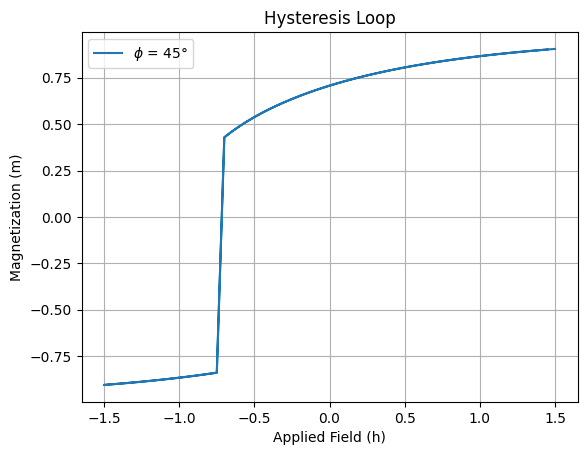

In [120]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize_scalar

# Material properties
Keff = 1e7  # Effective Uniaxial anisotropy J/m^3
Ms = 1e6    # Saturation Magnetization A/m
Hk = 2 * Keff / Ms  # Anisotropy field calculated

H1 = np.arange(-30, 30, 1)  # Applied External Field
Ha = np.concatenate((-H1, H1))  # Applied External Field
h = Ha / Hk

# Function to calculate energy
def energy(theta, h, phi):
    return np.sin(theta)**2 - h * np.cos(theta - phi)

# Function to find theta_min for given h and phi
def find_theta_min(h, phi):
    result = minimize_scalar(lambda theta: energy(theta, h, phi))
    return result.x

phi = np.deg2rad(45)
theta_min = np.zeros_like(h)

# Finding theta_min for each h value
for i, h_val in enumerate(h):
    t_min = find_theta_min(h_val, phi)
    theta_min[i] = t_min

m = np.cos(theta_min - phi)

# Plot m vs h
plt.plot(h, m, label=r'$\phi$ = 45$\degree$')
plt.xlabel('Applied Field (h)')
plt.ylabel('Magnetization (m)')
plt.title('Hysteresis Loop')
plt.grid(True)
plt.legend()
plt.show()